In [ ]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import stumpy
from matplotlib.patches import Rectangle
from datetime import datetime

In [ ]:
horizontal_fp = 'test_ag/HorizWell/hz_well_geometry.csv'
vert_fp = 'test_ag/VertWell/VertWellLog.xlsx'
tops_fp = 'test_ag/VertWell/VertWellTops.xlsx'

<ipython-input-629-bb6eb94b4a45>:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(2, sharex=False) # gridspec_kw={'hspace': 0}


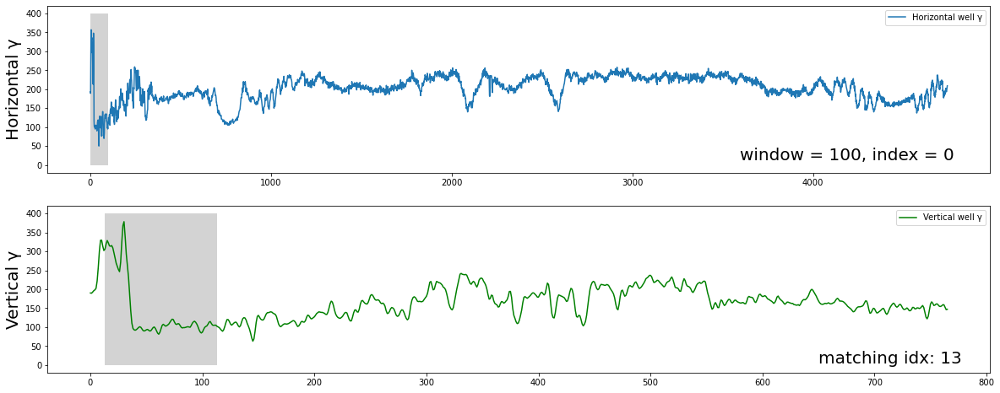

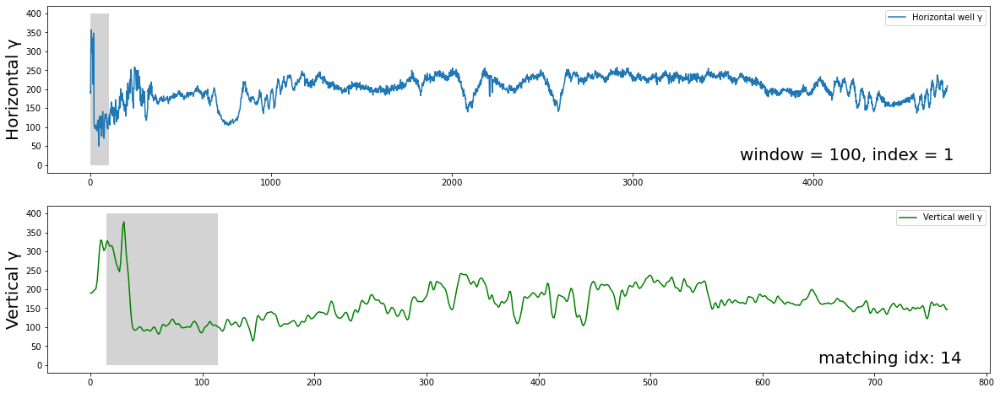

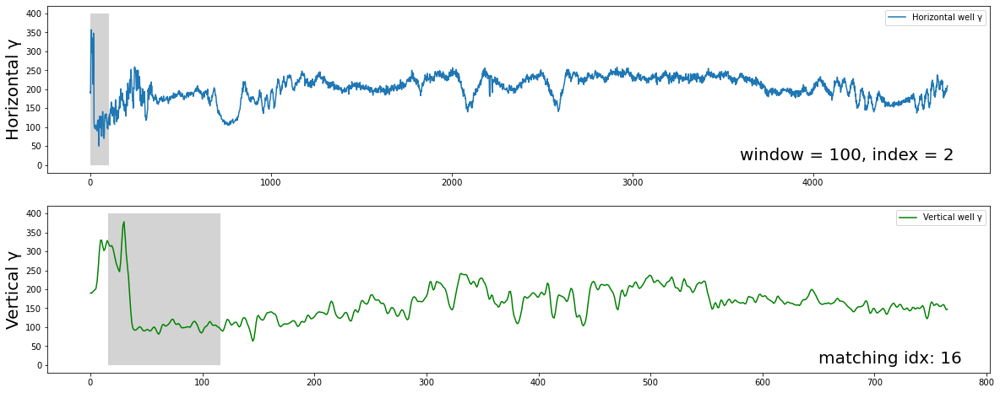

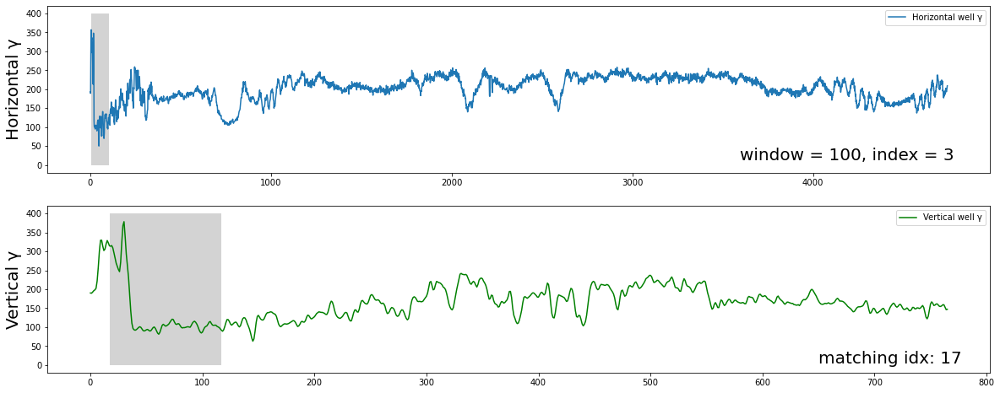

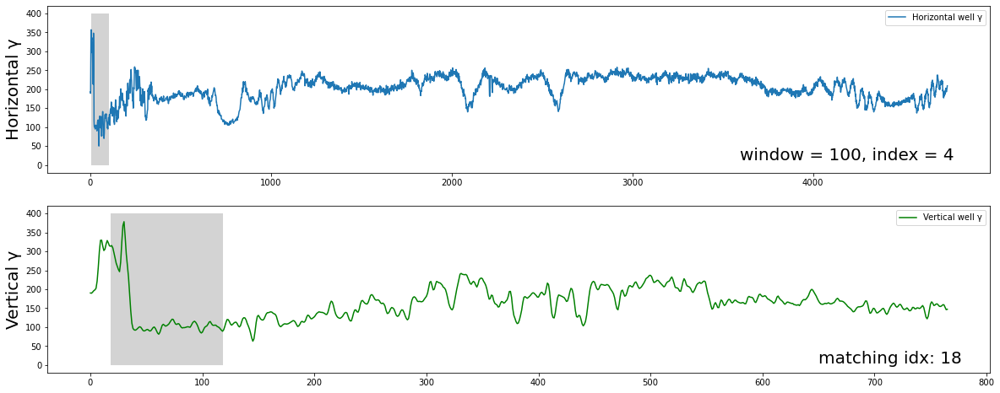

...

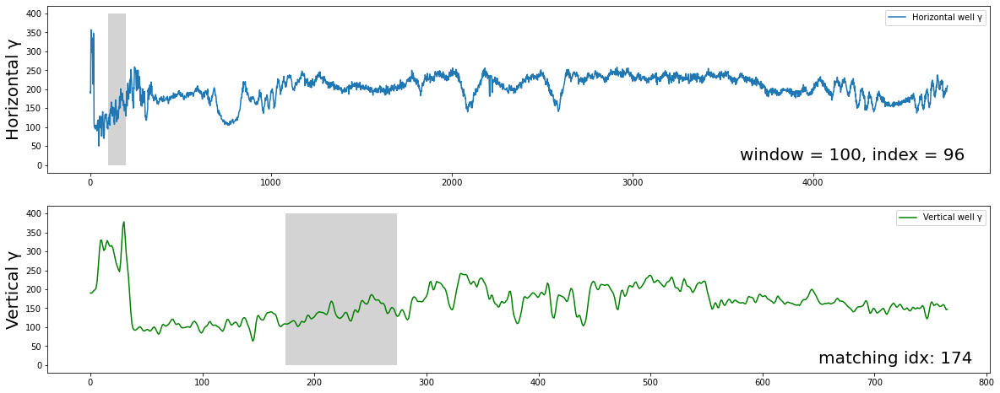

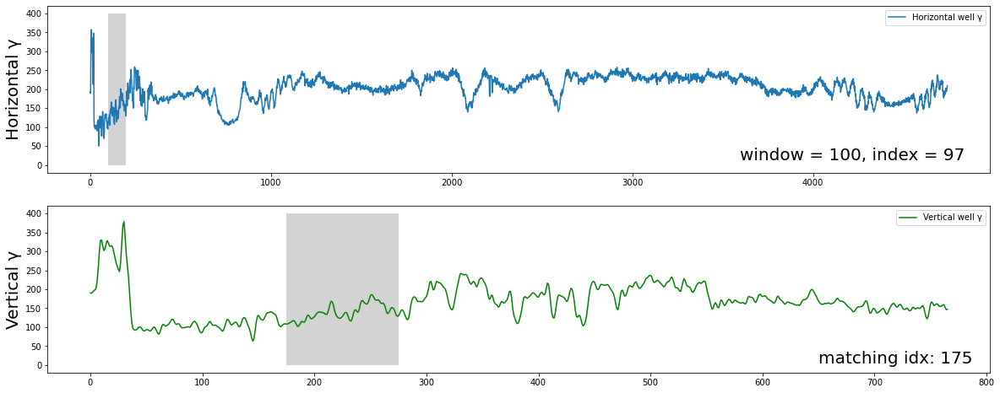

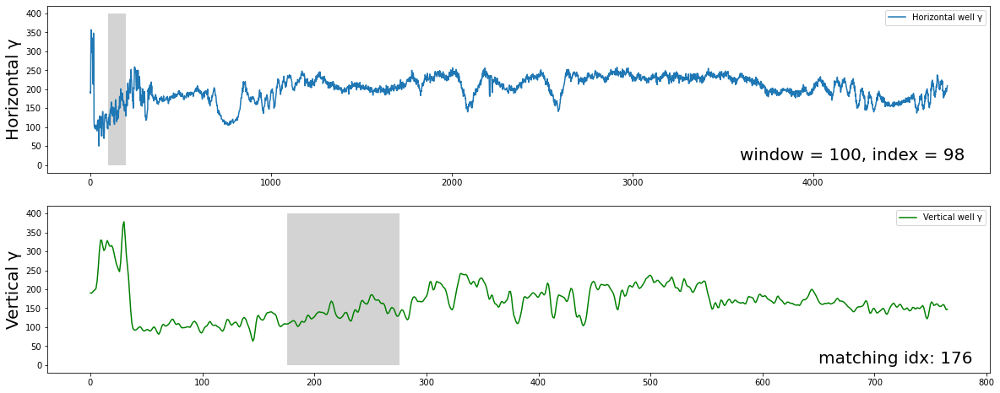

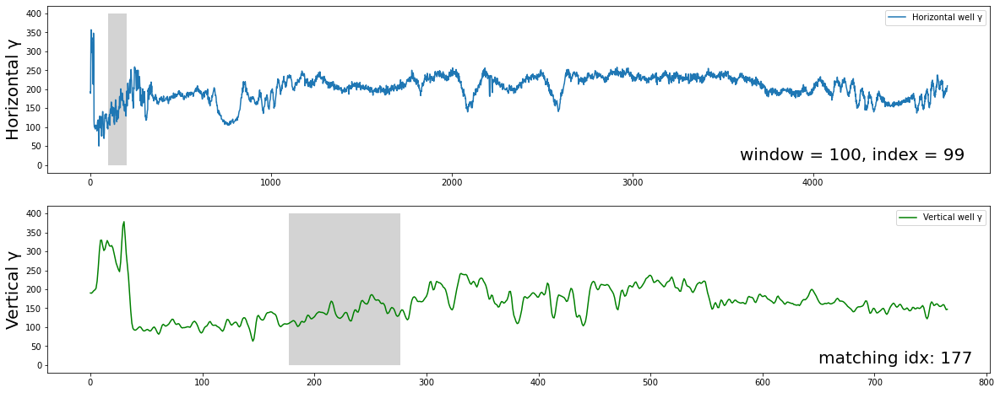

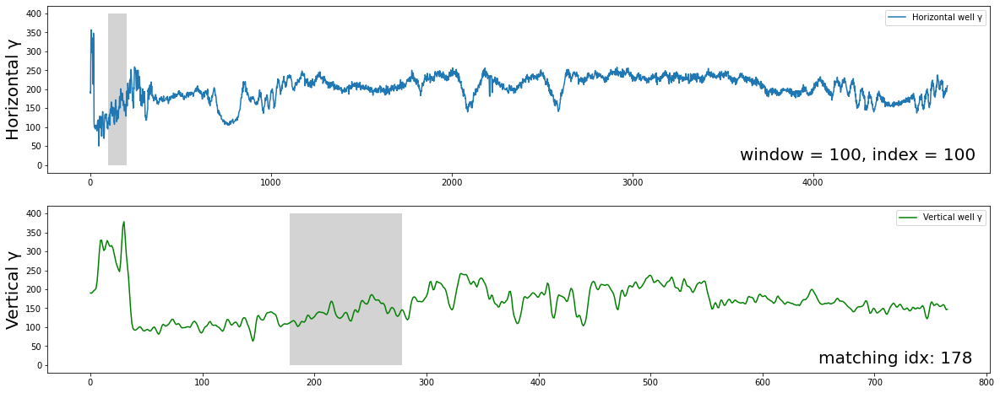

In [629]:
img_counter = 0
fpath = 'pics/'
horizontal_curve = horizontal_well[:201]
vert_well = vertical_well.Curve[:410]
window = 100
stride = 1
m = 0 # левая граница окна

windows_idx = np.arange(m, len(horizontal_curve)-window, stride)
for i in windows_idx:
    img_counter +=1
    horizontal_window = horizontal_well.Curve[m+i:window+i+m]

    distance_profile = stumpy.core.mass(Q=horizontal_window, T=vert_well)
    idx = np.argmin(distance_profile)

    fig, axs = plt.subplots(2, sharex=False) # gridspec_kw={'hspace': 0}
    axs[0].plot(horizontal_well.Curve, label='Horizontal well γ')
    axs[0].set_ylabel('Horizontal γ', fontsize='20')
    rect = Rectangle((i, 0), window, 400, facecolor='lightgrey')
    axs[0].add_patch(rect)
    plt.text(580, 540, f'window = {window}, index = {i}', color="black", fontsize=20)
    axs[0].legend()

    axs[1].plot(vertical_well.Curve, label='Vertical well γ', c='g')
    axs[1].set_ylabel('Vertical γ', fontsize='20')
    rect = Rectangle((idx, 0), window, 400, facecolor='lightgrey')
    plt.text(650, 3.6, f'matching idx: {idx}', color="black", fontsize=20)
    axs[1].add_patch(rect)
    axs[1].legend()
    
    fn_gen = f"{fpath}pic{str(datetime.now()).replace(':', '-')}.jpg"
    plt.savefig(fn_gen, dpi=100)

# Create gif from images

In [ ]:
from __future__ import division
import glob
from PIL import Image

target = './pics/*.jpg'
output = './pics/output.gif'

images = []
basewidth = 640

# Create images list
for filename in glob.glob(target):
    img = Image.open(filename)
    wpercent = (basewidth / float(img.size[0]))
    hsize = int((float(img.size[1]) * float(wpercent)))
    img = img.resize((basewidth, hsize), Image.ANTIALIAS)

    images.append(img)
    
images[0].save(output, format='GIF', append_images=images[1:], save_all=True, duration=3, loop=0)